<a href="https://colab.research.google.com/github/seyiban/PCB_defect_detection/blob/feature%2Fmy-changes/PCB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

셀 1 - Drive 마운트 & 데이터 압축 해제

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import zipfile, os
if not os.path.exists('/content/pcb2'):
    print('압축 해제 중...')
    with zipfile.ZipFile('/content/drive/MyDrive/dataset_augmented.zip', 'r') as z:
        z.extractall('/content/')
    print('완료')
else:
    print('이미 존재')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
압축 해제 중...
완료


셀 2 - 라이브러리 임포트 & 시드 고정

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, ConcatDataset
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from PIL import Image

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')

Device: cuda


셀 3 - 하이퍼파라미터 설정

In [ ]:
DATASET_ROOT  = '/content'
CATEGORIES    = ['pcb2', 'pcb3']
IMAGE_SIZE    = 224
BATCH_SIZE    = 32
NUM_EPOCHS    = 50
LEARNING_RATE = 0.0001
NUM_CLASSES   = 2

DRIVE_SAVE_PATH = '/content/drive/MyDrive/densenet121_pcb_v2.pth'
LOCAL_SAVE_PATH = 'best_model_densenet.pth'  # app.py 로드 경로

print('설정 완료')
print(f'  Device   : {DEVICE}')
print(f'  에폭     : {NUM_EPOCHS}')
print(f'  학습률   : {LEARNING_RATE}')

설정 완료
  Device   : cuda
  에폭     : 50
  학습률   : 0.0001


셀 4 - DataLoader 구성

In [ ]:
train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

train_datasets, val_datasets, test_datasets = [], [], []

for cat in CATEGORIES:
    train_datasets.append(datasets.ImageFolder(
        root=f'{DATASET_ROOT}/{cat}/train',
        transform=train_transform
    ))
    val_datasets.append(datasets.ImageFolder(
        root=f'{DATASET_ROOT}/{cat}/val',
        transform=eval_transform
    ))
    test_datasets.append(datasets.ImageFolder(
        root=f'{DATASET_ROOT}/{cat}/test',
        transform=eval_transform
    ))

train_dataset = ConcatDataset(train_datasets)
val_dataset   = ConcatDataset(val_datasets)
test_dataset  = ConcatDataset(test_datasets)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

class_to_idx = train_datasets[0].class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

print(f'클래스 매핑     : {class_to_idx}')
print(f'train 총 이미지 : {len(train_dataset)}장')
print(f'val   총 이미지 : {len(val_dataset)}장')
print(f'test  총 이미지 : {len(test_dataset)}장')

FileNotFoundError: [Errno 2] No such file or directory: '/content/pcb2/train'

셀 5 - 모델 정의

In [ ]:
model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
model.classifier = nn.Linear(model.classifier.in_features, NUM_CLASSES)
model = model.to(DEVICE)

# anomaly=0 에 3배 가중치
class_weights = torch.tensor([3.0, 1.0]).to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=class_weights)

# features는 작은 lr, classifier는 큰 lr
optimizer = optim.Adam([
    {'params': model.features.parameters(),   'lr': LEARNING_RATE * 0.1},
    {'params': model.classifier.parameters(), 'lr': LEARNING_RATE}
])

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', factor=0.5, patience=5
)

print(f'classifier : {model.classifier}')
print(f'총 파라미터: {sum(p.numel() for p in model.parameters()):,}')

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 197MB/s]


classifier : Linear(in_features=1024, out_features=2, bias=True)
총 파라미터: 6,955,906


셀 6 - 학습 & 검증 함수

In [ ]:
def train_one_epoch(model, loader, criterion, optimizer):
    model.train()
    total_loss, correct, total = 0, 0, 0

    for images, labels in loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += images.size(0)

    return total_loss / total, correct / total


def evaluate(model, loader, criterion):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += images.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)
    anomaly_mask = (all_labels == 0)
    anomaly_recall = (
        (all_preds[anomaly_mask] == 0).sum() / anomaly_mask.sum()
        if anomaly_mask.sum() > 0 else 0
    )

    return total_loss / total, correct / total, anomaly_recall


print('학습 함수 정의 완료')

학습 함수 정의 완료


셀 7 - 모델 학습

In [ ]:
best_val_acc        = 0.0
best_anomaly_recall = 0.0
train_losses, val_losses = [], []
train_accs,   val_accs   = [], []

for epoch in range(NUM_EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer)
    val_loss, val_acc, anomaly_recall = evaluate(model, val_loader, criterion)
    scheduler.step(val_acc)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    if anomaly_recall > best_anomaly_recall:
        best_anomaly_recall = anomaly_recall
        best_val_acc = val_acc
        torch.save(model.state_dict(), DRIVE_SAVE_PATH)
        saved = '← best 저장'
    else:
        saved = ''

    print(f'Epoch [{epoch+1:02d}/{NUM_EPOCHS}]  '
          f'train loss: {train_loss:.4f}  acc: {train_acc:.4f}  |  '
          f'val loss: {val_loss:.4f}  acc: {val_acc:.4f}  '
          f'anomaly recall: {anomaly_recall:.4f}  {saved}')

print(f'\n학습 완료!')
print(f'  Best val acc       : {best_val_acc:.4f}')
print(f'  Best anomaly recall: {best_anomaly_recall:.4f}')

Epoch [01/50]  train loss: 0.4425  acc: 0.6225  |  val loss: 0.5250  acc: 0.9212  anomaly recall: 0.2667  ← best 저장
Epoch [02/50]  train loss: 0.2671  acc: 0.8450  |  val loss: 0.3617  acc: 0.9152  anomaly recall: 0.0667  
Epoch [03/50]  train loss: 0.2151  acc: 0.8879  |  val loss: 0.3123  acc: 0.9152  anomaly recall: 0.0667  
Epoch [04/50]  train loss: 0.1902  acc: 0.9104  |  val loss: 0.2821  acc: 0.9121  anomaly recall: 0.1333  
Epoch [05/50]  train loss: 0.1653  acc: 0.9200  |  val loss: 0.2917  acc: 0.9121  anomaly recall: 0.0333  
Epoch [06/50]  train loss: 0.1656  acc: 0.9204  |  val loss: 0.2493  acc: 0.9333  anomaly recall: 0.2667  
Epoch [07/50]  train loss: 0.1378  acc: 0.9364  |  val loss: 0.2300  acc: 0.9394  anomaly recall: 0.3333  ← best 저장
Epoch [08/50]  train loss: 0.1259  acc: 0.9393  |  val loss: 0.2132  acc: 0.9394  anomaly recall: 0.6667  ← best 저장
Epoch [09/50]  train loss: 0.1269  acc: 0.9343  |  val loss: 0.2277  acc: 0.9394  anomaly recall: 0.5667  
Epoch [10/

셀 8 - 학습 곡선 시각화

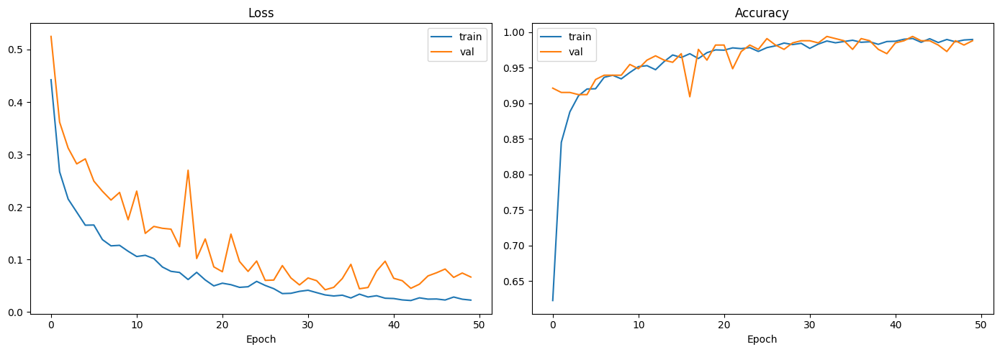

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(train_losses, label='train')
axes[0].plot(val_losses,   label='val')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()

axes[1].plot(train_accs, label='train')
axes[1].plot(val_accs,   label='val')
axes[1].set_title('Accuracy')
axes[1].set_xlabel('Epoch')
axes[1].legend()

plt.tight_layout()
plt.show()

셀 9 - 테스트셋 평가 & 혼돈 행

              precision    recall  f1-score   support

     anomaly       0.93      0.90      0.92        30
      normal       0.99      0.99      0.99       300

    accuracy                           0.98       330
   macro avg       0.96      0.95      0.95       330
weighted avg       0.98      0.98      0.98       330



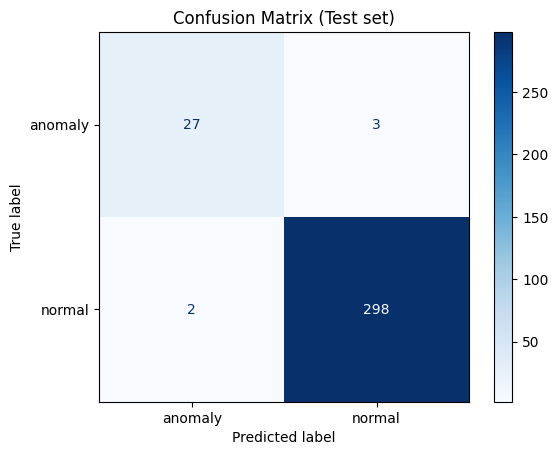

In [ ]:
model.load_state_dict(torch.load(DRIVE_SAVE_PATH, map_location=DEVICE))
model.eval()

all_preds, all_labels = [], []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(DEVICE)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

print(classification_report(
    all_labels, all_preds,
    target_names=[idx_to_class[0], idx_to_class[1]]
))

cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(cm, display_labels=[idx_to_class[0], idx_to_class[1]])
disp.plot(cmap='Blues')
plt.title('Confusion Matrix (Test set)')
plt.show()

셀 10 - 카테고리별 anomaly 탐지율 확인

In [ ]:
for cat in CATEGORIES:
    paths = list(Path(f'/content/{cat}/test/anomaly').glob('*.*'))
    correct = 0
    for p in paths:
        img = Image.open(p).convert('RGB')
        t = eval_transform(img).unsqueeze(0).to(DEVICE)
        with torch.no_grad():
            out = model(t)
            pred = out.argmax(dim=1).item()
        if pred == 0:  # anomaly=0
            correct += 1
    print(f'{cat} anomaly 탐지율: {correct}/{len(paths)} ({correct/len(paths)*100:.1f}%)')

pcb2 anomaly 탐지율: 13/15 (86.7%)
pcb3 anomaly 탐지율: 14/15 (93.3%)


셀 11 - app.py 작성

In [ ]:
%%writefile app.py
import streamlit as st
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import numpy as np
import io

@st.cache_resource
def load_model():
    model = models.densenet121(weights=None)
    model.classifier = nn.Linear(model.classifier.in_features, 2)
    model.load_state_dict(torch.load('best_model_densenet.pth', map_location='cpu'))
    model.eval()
    return model

def predict(img, model, threshold=0.5):
    img_tensor = transform(img).unsqueeze(0)
    with torch.no_grad():
        output = model(img_tensor)
        probs = torch.softmax(output, dim=1)[0]
        prob_defect = probs[0].item()
    pred_class = 1 if prob_defect >= threshold else 0
    confidence = prob_defect if pred_class == 1 else 1 - prob_defect
    return pred_class, confidence, prob_defect

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def pil_to_bytes(img):
    buf = io.BytesIO()
    img.save(buf, format='PNG')
    return buf.getvalue()

st.set_page_config(page_title="PCB 결함 탐지 시스템", page_icon="🔍", layout="wide")

st.markdown("""
<style>
    .result-defect {
        background: linear-gradient(135deg, #fee2e2, #fecaca);
        border-left: 6px solid #dc2626;
        padding: 24px 28px; border-radius: 14px; margin: 16px 0;
    }
    .result-normal {
        background: linear-gradient(135deg, #dcfce7, #bbf7d0);
        border-left: 6px solid #16a34a;
        padding: 24px 28px; border-radius: 14px; margin: 16px 0;
    }
    .result-title { font-size: 26px; font-weight: bold; margin: 0 0 6px 0; }
    .result-sub { font-size: 15px; margin: 0; opacity: 0.85; }
    .metric-box {
        background: white; border-radius: 14px; padding: 20px 16px;
        text-align: center; box-shadow: 0 2px 12px rgba(0,0,0,0.07);
        border: 1px solid #f1f5f9;
    }
    .metric-value { font-size: 30px; font-weight: bold; color: #1e293b; }
    .metric-label { font-size: 12px; color: #94a3b8; margin-top: 6px; letter-spacing: 0.05em; text-transform: uppercase; }
    .info-box {
        background: #eff6ff; border: 1px solid #bfdbfe;
        border-radius: 12px; padding: 16px 20px;
        font-size: 14px; color: #1e40af; line-height: 1.6;
    }
    .section-title {
        font-size: 16px; font-weight: 700; color: #475569;
        margin: 24px 0 12px 0; letter-spacing: 0.03em; text-transform: uppercase;
    }
    .img-card {
        background: white; border-radius: 14px; padding: 16px;
        box-shadow: 0 2px 12px rgba(0,0,0,0.07); border: 1px solid #f1f5f9;
        text-align: center;
    }
    .img-label { font-size: 13px; color: #64748b; margin-top: 10px; font-weight: 600; }
</style>
""", unsafe_allow_html=True)

st.markdown("# 🔍 PCB 결함 탐지 시스템")
st.markdown("DenseNet-121 기반 PCB 이미지 결함 자동 검사 시스템")
st.divider()

with st.sidebar:
    st.markdown("## ⚙️ 검사 설정")
    threshold = st.slider("결함 판정 임계값", 0.1, 0.9, 0.5, 0.05,
                          help="값이 낮을수록 결함을 더 민감하게 탐지합니다")
    st.divider()
    st.markdown("## 📊 모델 정보")
    st.markdown("""
| 항목 | 내용 |
|------|------|
| 모델 | DenseNet-121 |
| 데이터 | VisA PCB2/PCB3 |
| 에폭 | 50 |
| 학습률 | 0.0001 |
| Threshold | 0.5 |
""")
    st.divider()
    st.markdown("## 💡 사용 가이드")
    st.markdown("""
1. PCB 이미지를 업로드하세요
2. AI가 자동으로 결함을 분석합니다
3. 결과 및 확률을 확인하세요
4. 필요시 이미지를 다운로드하세요

**지원 형식**: JPG, JPEG, PNG
""")

uploaded_file = st.file_uploader("📁  PCB 이미지를 업로드하세요", type=["jpg", "jpeg", "png"])

if uploaded_file is None:
    st.markdown("""
<div class="info-box">
ℹ️ <b>PCB 이미지를 업로드하면 자동으로 결함 분석을 시작합니다.</b><br>
정상 및 결함 PCB 이미지를 업로드해 AI 판정 결과와 확률을 확인할 수 있습니다.
</div>
""", unsafe_allow_html=True)

    st.markdown("")
    st.markdown('<div class="section-title">📈 모델 성능 요약</div>', unsafe_allow_html=True)
    c1, c2, c3, c4 = st.columns(4)
    with c1:
        st.markdown('<div class="metric-box"><div class="metric-value">50</div><div class="metric-label">학습 에폭</div></div>', unsafe_allow_html=True)
    with c2:
        st.markdown('<div class="metric-box"><div class="metric-value">1e-4</div><div class="metric-label">Learning Rate</div></div>', unsafe_allow_html=True)
    with c3:
        st.markdown('<div class="metric-box"><div class="metric-value">PCB2+3</div><div class="metric-label">학습 데이터</div></div>', unsafe_allow_html=True)
    with c4:
        st.markdown('<div class="metric-box"><div class="metric-value">0.5</div><div class="metric-label">기본 Threshold</div></div>', unsafe_allow_html=True)

else:
    with st.spinner("🔄  AI가 이미지를 분석 중입니다..."):
        try:
            model = load_model()
            img = Image.open(uploaded_file).convert('RGB')
        except Exception as e:
            st.error(f"❌  이미지를 불러오는 데 실패했습니다: {e}")
            st.stop()

        img_resized = img.resize((224, 224))

        try:
            pred_class, confidence, prob_defect = predict(img, model, threshold)
        except Exception as e:
            st.error(f"❌  분석 중 오류가 발생했습니다: {e}")
            st.stop()

    if pred_class == 1:
        st.markdown(f"""
<div class="result-defect">
    <p class="result-title">⚠️ 결함 감지 (Defect Detected)</p>
    <p class="result-sub" style="color:#991b1b;">결함 확률 {prob_defect*100:.1f}% — 즉각적인 검토가 필요합니다</p>
</div>""", unsafe_allow_html=True)
    else:
        st.markdown(f"""
<div class="result-normal">
    <p class="result-title">✅ 정상 (Normal)</p>
    <p class="result-sub" style="color:#14532d;">정상 확률 {(1-prob_defect)*100:.1f}% — 이상이 감지되지 않았습니다</p>
</div>""", unsafe_allow_html=True)

    st.markdown("")
    img_col, stat_col = st.columns([1, 1.6], gap="large")

    with img_col:
        st.markdown('<div class="section-title">📸 입력 이미지</div>', unsafe_allow_html=True)
        st.markdown('<div class="img-card">', unsafe_allow_html=True)
        st.image(img_resized, use_container_width=True)
        st.markdown(f'<div class="img-label">{uploaded_file.name}</div>', unsafe_allow_html=True)
        st.markdown('</div>', unsafe_allow_html=True)

    with stat_col:
        st.markdown('<div class="section-title">📊 분석 결과</div>', unsafe_allow_html=True)

        c1, c2 = st.columns(2)
        with c1:
            color = "#dc2626" if pred_class == 1 else "#16a34a"
            label = "결함" if pred_class == 1 else "정상"
            st.markdown(f'<div class="metric-box"><div class="metric-value" style="color:{color}">{label}</div><div class="metric-label">판정 결과</div></div>', unsafe_allow_html=True)
        with c2:
            st.markdown(f'<div class="metric-box"><div class="metric-value">{threshold}</div><div class="metric-label">적용 임계값</div></div>', unsafe_allow_html=True)

        st.markdown("")

        st.markdown("**결함 확률**")
        st.progress(prob_defect, text=f"{prob_defect*100:.1f}%")

        st.markdown("**정상 확률**")
        st.progress(1 - prob_defect, text=f"{(1-prob_defect)*100:.1f}%")

        st.markdown("**판정 신뢰도**")
        st.progress(confidence, text=f"{confidence*100:.1f}%")

        st.markdown("")
        st.download_button(
            label="📥 이미지 다운로드",
            data=pil_to_bytes(img_resized),
            file_name="pcb_result.png",
            mime="image/png",
            use_container_width=True
        )

Overwriting app.py


셀 12 - 모델 & app.py 다운로드

In [ ]:
import shutil
from google.colab import files

# shutil.copy(DRIVE_SAVE_PATH, LOCAL_SAVE_PATH)
# print(f'모델 복사 완료: {DRIVE_SAVE_PATH} → {LOCAL_SAVE_PATH}')

files.download('app.py')
# files.download(LOCAL_SAVE_PATH)
print('✅ 다운로드 완료!')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ 다운로드 완료!


추가 -- 학습 데이터 anomaly 샘플 시각화

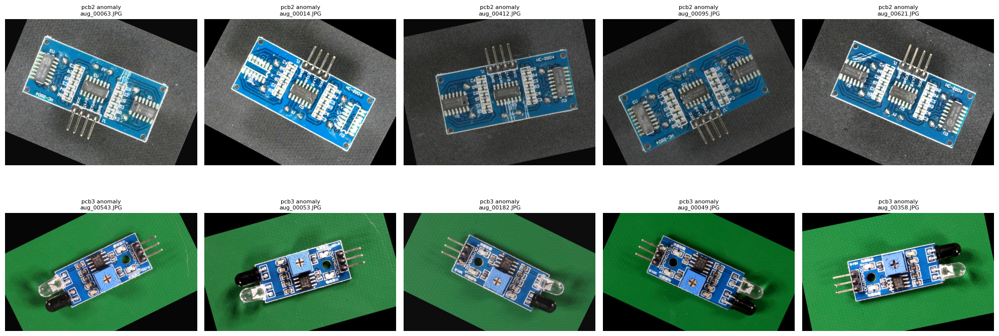

pcb2 train anomaly: 700장
pcb2 val anomaly: 15장
pcb2 test anomaly: 15장
pcb3 train anomaly: 700장
pcb3 val anomaly: 15장
pcb3 test anomaly: 15장


In [ ]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import random

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for i, cat in enumerate(['pcb2', 'pcb3']):
    anomaly_imgs = list(Path(f'/content/{cat}/train/anomaly').glob('*.*'))
    samples = random.sample(anomaly_imgs, min(5, len(anomaly_imgs)))
    for j, p in enumerate(samples):
        axes[i][j].imshow(Image.open(p))
        axes[i][j].set_title(f'{cat} anomaly\n{p.name}', fontsize=8)
        axes[i][j].axis('off')

plt.tight_layout()
plt.show()

# anomaly 샘플 수 확인
for cat in ['pcb2', 'pcb3']:
    for split in ['train', 'val', 'test']:
        n = len(list(Path(f'/content/{cat}/{split}/anomaly').glob('*.*')))
        print(f'{cat} {split} anomaly: {n}장')

In [ ]:
for cat in ['pcb2', 'pcb3']:
    for split in ['train', 'val', 'test']:
        for label in ['normal', 'anomaly']:
            imgs = list(Path(f'/content/{cat}/{split}/{label}').glob('*.*'))
            # aug_ 접두사 없는 원본만 카운트
            originals = [p for p in imgs if not p.name.startswith('aug_')]
            print(f'{cat} {split} {label}: 전체 {len(imgs)}장 / 원본 {len(originals)}장')

pcb2 train normal: 전체 700장 / 원본 700장
pcb2 train anomaly: 전체 700장 / 원본 70장
pcb2 val normal: 전체 150장 / 원본 150장
pcb2 val anomaly: 전체 15장 / 원본 15장
pcb2 test normal: 전체 150장 / 원본 150장
pcb2 test anomaly: 전체 15장 / 원본 15장
pcb3 train normal: 전체 700장 / 원본 700장
pcb3 train anomaly: 전체 700장 / 원본 70장
pcb3 val normal: 전체 150장 / 원본 150장
pcb3 val anomaly: 전체 15장 / 원본 15장
pcb3 test normal: 전체 150장 / 원본 150장
pcb3 test anomaly: 전체 15장 / 원본 15장


/tmp/ipykernel_664/1320064261.py:18: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_664/1320064261.py:18: UserWarning: Glyph 48376 (\N{HANGUL SYLLABLE BON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_664/1320064261.py:18: UserWarning: Glyph 51204 (\N{HANGUL SYLLABLE JEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_664/1320064261.py:18: UserWarning: Glyph 52404 (\N{HANGUL SYLLABLE CE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48376 (\N{HANGUL SYLLABLE BON}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/di

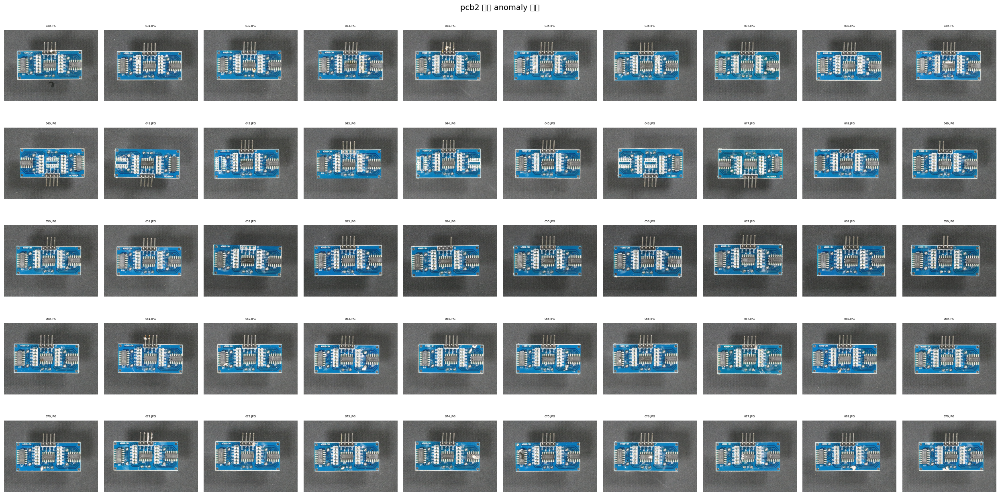

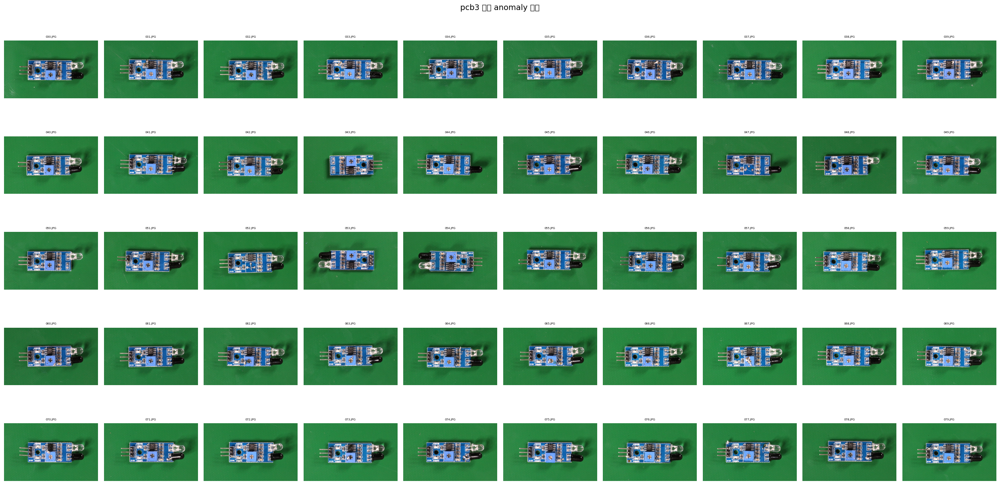

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

for cat in ['pcb2', 'pcb3']:
    orig = sorted([
        f for f in Path(f'/content/{cat}/train/anomaly').iterdir()
        if not f.name.startswith('aug_')
    ])

    fig, axes = plt.subplots(5, 10, figsize=(25, 13))
    fig.suptitle(f'{cat} 원본 anomaly 전체', fontsize=14)
    for i, ax in enumerate(axes.flat):
        if i < len(orig):
            ax.imshow(Image.open(orig[i]).convert('RGB'))
            ax.set_title(orig[i].name, fontsize=5)
        ax.axis('off')
    plt.tight_layout()
    plt.show()